# Importing necessary libraries

In [0]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
# !pip install missingno
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.api.types import is_numeric_dtype
from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor

# Reading the dataset

Place the data directory in the same location as this notebook.

In [0]:
nyc_taxi_df = pd.read_csv('data/nyc_taxi_data.csv')

# EDA

In [49]:
nyc_taxi_df.shape

(11514, 10)

We have 17617 rows and 10 columns including the target column.

Let's see how the data looks like by inspecting a first few rows.

In [50]:
nyc_taxi_df.head()

,timestamp,passenger_count,trip_distance,total_amount,humidity,pressure,temperature,weather_description,wind_direction,wind_speed
0,1498050000,26805,45733.59,285315.95,57.0,1014.0,295.37,sky is clear,290.0,3.0
1,1486310400,27487,50781.62,262346.81,51.0,1016.0,273.91,overcast clouds,250.0,5.0
2,1464897600,41686,71816.81,400042.82,82.0,1020.0,296.72,haze,90.0,5.0
3,1456308000,31526,44498.25,291332.16,86.0,1019.0,275.77,mist,70.0,6.0
4,1458097200,4138,9353.05,42545.26,81.0,1010.0,282.52,overcast clouds,15.0,1.0


Hmm nothing unusual so far. Let's see the core statistics.

In [51]:
nyc_taxi_df.describe()

,timestamp,passenger_count,trip_distance,total_amount,humidity,pressure,temperature,wind_direction,wind_speed
count,1.151400e+04,11514.000000,1.151400e+04,1.151400e+04,10463.000000,10463.00000,10463.000000,10462.000000,10462.000000
mean,1.482694e+09,22875.252475,5.492726e+04,2.277745e+05,65.327153,1017.36500,286.688927,190.418945,3.302810
std,2.684580e+07,10735.930477,3.284988e+05,1.059798e+05,20.866883,8.03376,10.223053,110.667133,2.074437
min,9.783072e+08,1.000000,0.000000e+00,2.300000e+00,10.000000,988.00000,2.000000,0.000000,0.000000
25%,1.467415e+09,14649.500000,3.030248e+04,1.448471e+05,49.000000,1013.00000,278.995000,80.000000,2.000000
50%,1.483202e+09,25435.500000,4.466087e+04,2.535528e+05,65.000000,1017.00000,287.430000,210.000000,3.000000
75%,1.498895e+09,30354.000000,5.264237e+04,3.024287e+05,83.000000,1022.00000,294.875000,287.000000,4.000000
max,2.626186e+09,59077.000000,1.913556e+07,1.550589e+06,100.000000,1043.00000,308.370000,360.000000,18.000000


Looking at the count row we can infer that there certainly are some missing values. Let's check for them. Also note that here we do not see the statistics for non-numeric comlumns i.e. 'weather_description'.

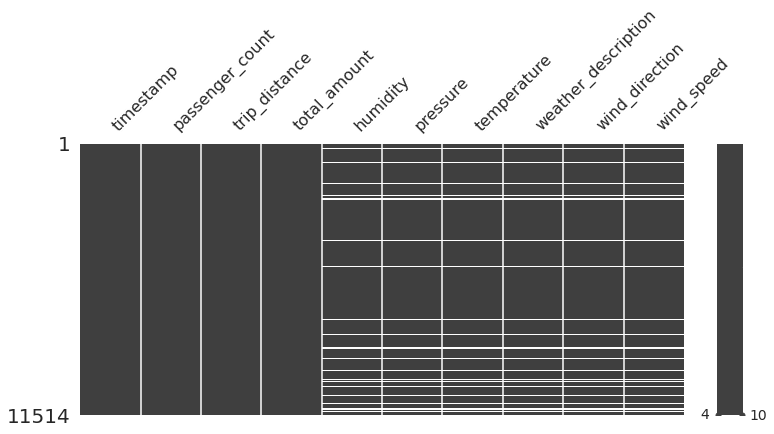

In [52]:
msno.matrix(nyc_taxi_df,figsize=(12,5));

Oof looks like for a number of records we only have the bare basic data i.e. the timestamp, passenger count, distance and amount. We do not have the values for atmospheric variables.

We will have to decide how we deal with this. First let's check the percentage of missing values.

In [53]:
nyc_taxi_df.isna().mean().round(4)*100

timestamp              0.00
passenger_count        0.00
trip_distance          0.00
total_amount           0.00
humidity               9.13
pressure               9.13
temperature            9.13
weather_description    9.14
wind_direction         9.14
wind_speed             9.14
dtype: float64

Hmm its around 9%. Now there are two options: we delete the records with missing data or we impute the missing values. Before we make a decision, we have to understand the reason why data is missing i.e. what nature is our missing data:

1. Missing at Random (MAR)
2. Missing Completely at Random (MCAR)
3. Missing not at Random (MNAR)

In the first two cases, it is safe to remove the data with missing values depending upon their occurrences, while in the third case removing observations with missing values can produce a bias in the model. So let's conclude how/why our data is missing.



In [54]:
missing_rows = nyc_taxi_df[nyc_taxi_df.isna().any(axis=1)]
missing_rows.head()

,timestamp,passenger_count,trip_distance,total_amount,humidity,pressure,temperature,weather_description,wind_direction,wind_speed
13,1230757200,5,0.61,6.80,NaN,NaN,NaN,NaN,NaN,NaN
19,1510686000,32606,53850.26,330192.71,NaN,NaN,NaN,NaN,NaN,NaN
20,1509800400,31829,47248.07,278149.54,NaN,NaN,NaN,NaN,NaN,NaN
39,1511528400,22418,34495.81,183275.81,NaN,NaN,NaN,NaN,NaN,NaN
65,1514401200,26229,41574.37,256100.36,NaN,NaN,NaN,NaN,NaN,NaN


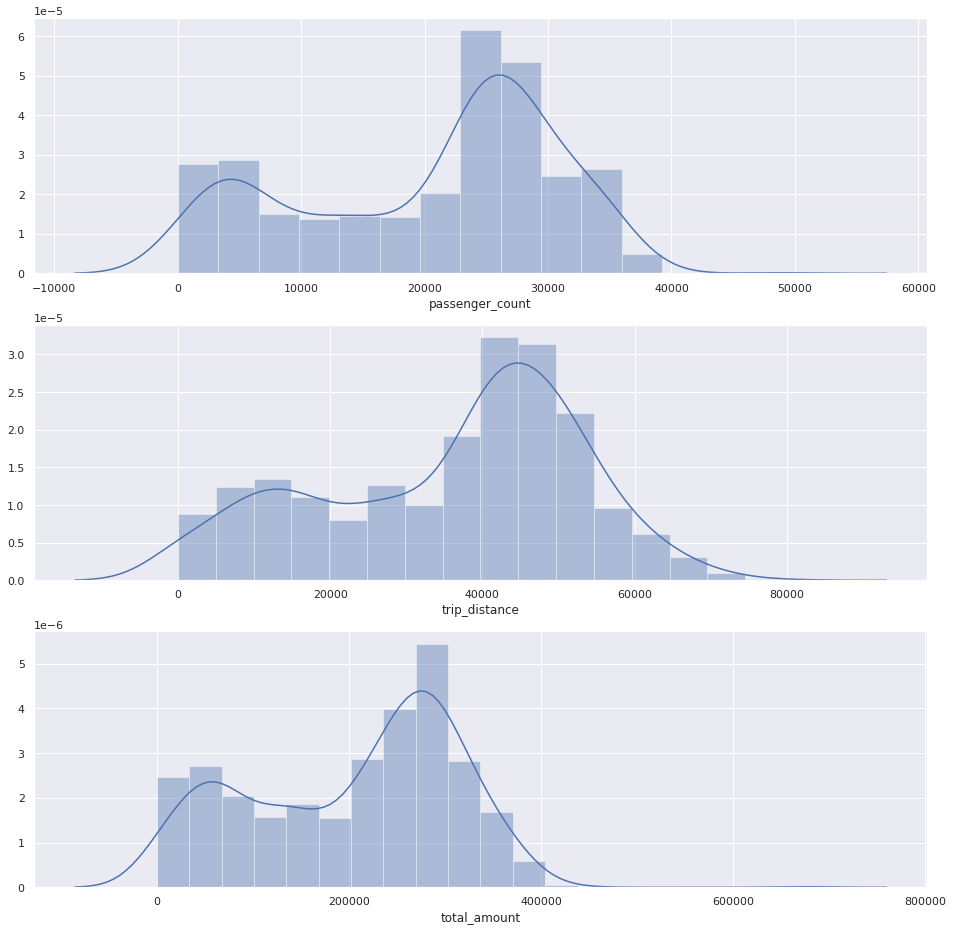

In [55]:
fig, axes = plt.subplots(nrows=3,ncols=1);
fig.set_size_inches(16, 16);

sns.distplot(missing_rows['passenger_count'],ax=axes[0]);
sns.distplot(missing_rows['trip_distance'],ax=axes[1]);
sns.distplot(missing_rows['total_amount'],ax=axes[2]);

Well the distribution of the other fields in the case of missing rows resembles a somewhat random distribution. We can get rid of the rows with missing data.

In [56]:
nyc_taxi_df = nyc_taxi_df.dropna()
print("Number of rows are deleting missing values:", nyc_taxi_df.shape[0])

Number of rows are deleting missing values: 10462


Now the attribute 'weather_description' is tricky. If it indeed contains raw description, we might need to do some nlp to embed the words to a vector in order to make use of them.

So let's check if 'weather_description' is categorical. If so then our work is easier. We just need to encode them as integers. 

In [57]:
print(len(nyc_taxi_df['weather_description'].unique()))
nyc_taxi_df['weather_description'].unique()

32


array(['sky is clear', 'overcast clouds', 'haze', 'mist', 'few clouds',
       'broken clouds', 'moderate rain', 'drizzle', 'scattered clouds',
       'light rain', 'light intensity drizzle', 'heavy intensity rain',
       'thunderstorm', 'fog', 'light snow', 'snow', 'freezing rain',
       'proximity thunderstorm', 'heavy snow', 'dust',
       'thunderstorm with rain', 'thunderstorm with light drizzle',
       'thunderstorm with light rain', 'heavy intensity drizzle', 'sand',
       'smoke', 'thunderstorm with heavy rain',
       'proximity thunderstorm with rain', 'heavy thunderstorm',
       'squalls', 'proximity thunderstorm with drizzle', 'shower rain'],
      dtype=object)

Alright so we have 34 unqiue descriptions and analysing those we can make the assumption that they are indeed categorical. Let's encode them as integers.

In [58]:
le = LabelEncoder()
nyc_taxi_df['weather_description'] = le.fit_transform(nyc_taxi_df['weather_description'])
nyc_taxi_df['weather_description'] = nyc_taxi_df['weather_description'].astype("category")
nyc_taxi_df.head()

,timestamp,passenger_count,trip_distance,total_amount,humidity,pressure,temperature,weather_description,wind_direction,wind_speed
0,1498050000,26805,45733.59,285315.95,57.0,1014.0,295.37,23,290.0,3.0
1,1486310400,27487,50781.62,262346.81,51.0,1016.0,273.91,16,250.0,5.0
2,1464897600,41686,71816.81,400042.82,82.0,1020.0,296.72,6,90.0,5.0
3,1456308000,31526,44498.25,291332.16,86.0,1019.0,275.77,14,70.0,6.0
4,1458097200,4138,9353.05,42545.26,81.0,1010.0,282.52,16,15.0,1.0


Now we move on to finding and removing outliers.

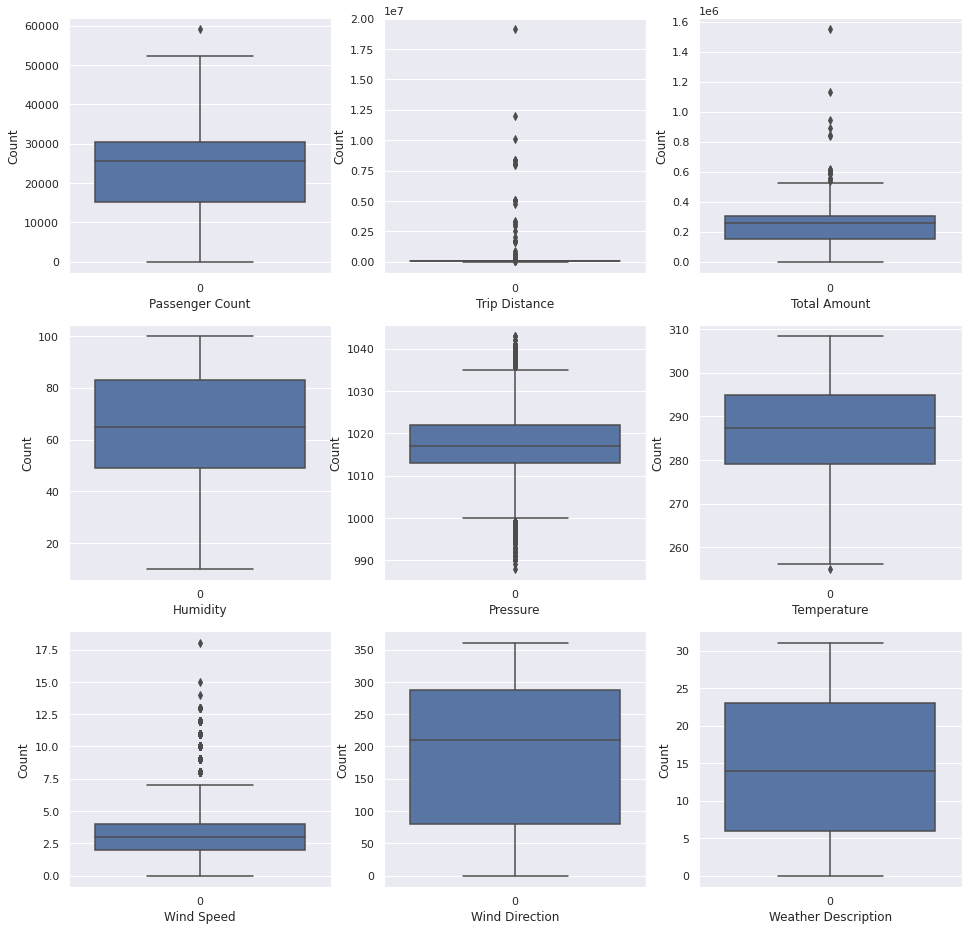

In [59]:
fig, axes = plt.subplots(nrows=3,ncols=3);
fig.set_size_inches(16, 16);
sns.boxplot(data=nyc_taxi_df['passenger_count'],ax=axes[0][0]);
sns.boxplot(data=nyc_taxi_df['trip_distance'],ax=axes[0][1]);
sns.boxplot(data=nyc_taxi_df['total_amount'],ax=axes[0][2]);
sns.boxplot(data=nyc_taxi_df['humidity'],ax=axes[1][0]);
sns.boxplot(data=nyc_taxi_df['pressure'],ax=axes[1][1]);
sns.boxplot(data=nyc_taxi_df['temperature'],ax=axes[1][2]);
sns.boxplot(data=nyc_taxi_df['wind_speed'],ax=axes[2][0]);
sns.boxplot(data=nyc_taxi_df['wind_direction'],ax=axes[2][1]);
sns.boxplot(data=nyc_taxi_df['weather_description'],ax=axes[2][2]);

axes[0][0].set(xlabel='Passenger Count', ylabel='Count');
axes[0][1].set(xlabel='Trip Distance', ylabel='Count');
axes[0][2].set(xlabel='Total Amount', ylabel='Count');
axes[1][0].set(xlabel='Humidity', ylabel='Count');
axes[1][1].set(xlabel='Pressure', ylabel='Count');
axes[1][2].set(xlabel='Temperature', ylabel='Count');
axes[2][0].set(xlabel='Wind Speed', ylabel='Count');
axes[2][1].set(xlabel='Wind Direction', ylabel='Count');
axes[2][2].set(xlabel='Weather Description', ylabel='Count');

As we can see there certainly are some outliers in these features: 'passenger_count', 'trip_distance', 'total_amount', 'pressure' and 'wind_speed'.

We will remove them by calculating their z-scores and then filtering the dataframe.

In [0]:
features_with_outliers = ['passenger_count', 'trip_distance', 'total_amount', 'pressure', 'wind_speed']

In [0]:
for feature in features_with_outliers:
  if is_numeric_dtype(nyc_taxi_df[feature]):
    feature_zscore = feature + '_zscore'
    nyc_taxi_df[feature_zscore] = (nyc_taxi_df[feature] - nyc_taxi_df[feature].mean()) / nyc_taxi_df[feature].std(ddof=0)

    nyc_taxi_df = nyc_taxi_df[nyc_taxi_df[feature_zscore] < 3]
    nyc_taxi_df = nyc_taxi_df.drop(feature_zscore, axis=1)

In [62]:
print("Number of rows are deleting outliers:", nyc_taxi_df.shape[0])

Number of rows are deleting outliers: 10266


Now let's see how the features are correlated as well as their correlation with target.

In [0]:
features = list(nyc_taxi_df.columns)
features.remove('timestamp')
features.remove('passenger_count')

target = 'passenger_count'

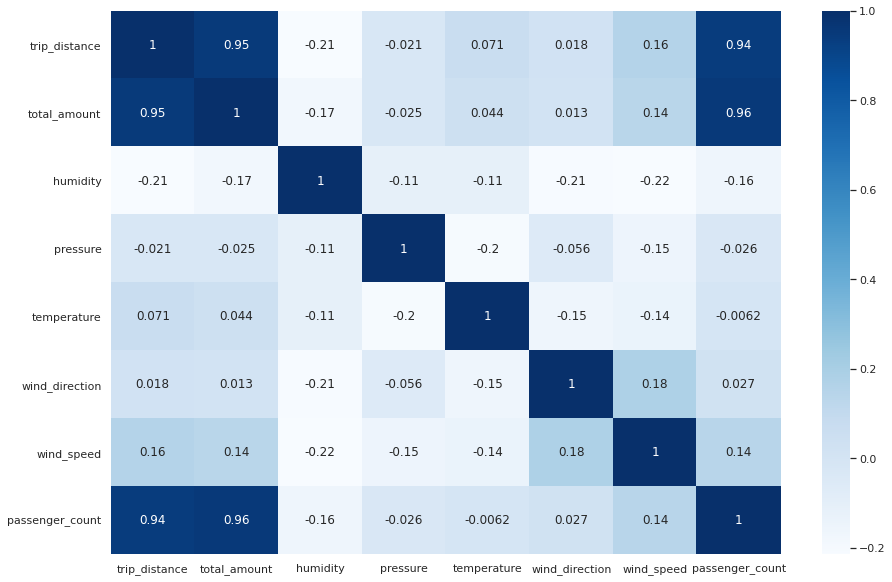

In [64]:
corr = nyc_taxi_df[features+[target]].corr(method="spearman")
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
        cmap='Blues',
        annot=True);

There isn't strong correlation other than the trip_distance-total_amount-passenger_count pair which makes sense. I was expecting strong correlation between the weather conditions also but evidently that's not the case.

Now as you may have noticed the correlation matrix doesn't include non-numeric features i.e. in our case 'weather_description' which is categorical. Hence, we will analyse it separately pair by pair with each feature.

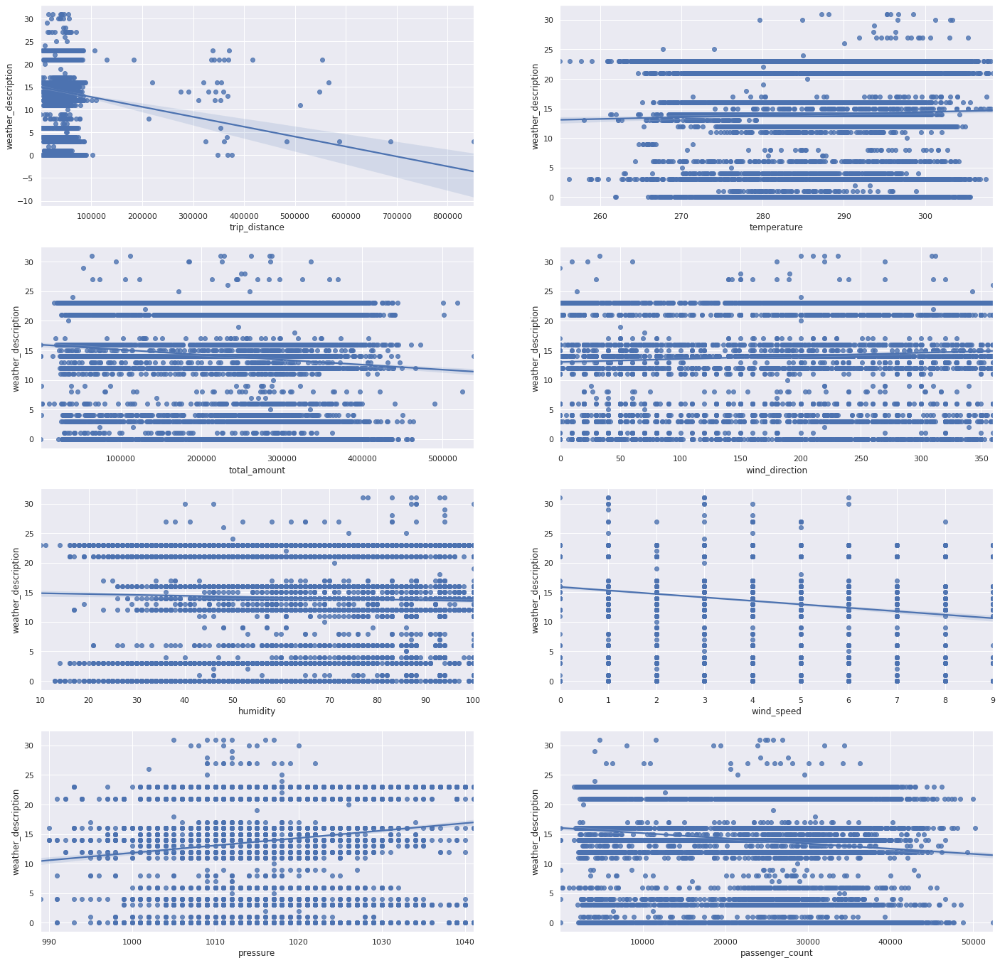

In [65]:
fig, axes = plt.subplots(nrows=4,ncols=2);
fig.set_size_inches(24, 24);
sns.regplot(x="trip_distance", y="weather_description", data=nyc_taxi_df,ax=axes[0][0]);
sns.regplot(x="total_amount", y="weather_description", data=nyc_taxi_df,ax=axes[1][0]);
sns.regplot(x="humidity", y="weather_description", data=nyc_taxi_df,ax=axes[2][0]);
sns.regplot(x="pressure", y="weather_description", data=nyc_taxi_df,ax=axes[3][0]);
sns.regplot(x="temperature", y="weather_description", data=nyc_taxi_df,ax=axes[0][1]);
sns.regplot(x="wind_direction", y="weather_description", data=nyc_taxi_df,ax=axes[1][1]);
sns.regplot(x="wind_speed", y="weather_description", data=nyc_taxi_df,ax=axes[2][1]);
sns.regplot(x="passenger_count", y="weather_description", data=nyc_taxi_df,ax=axes[3][1]);

Well basically nothing to see here. No evident correlation. Anyways we will keep all the available features.

So having done that we finally have a dataset we can train and test our model on!

# t-SNE

But first I want to embed the data onto a 2-d space and visualize it there. Let's see if we have a visible regression line. 

**Note that the computation in this section will take some time.**

In [0]:
X_embedded = TSNE(n_components=2).fit_transform(nyc_taxi_df[features])

In [67]:
X_embedded.shape

(10266, 2)

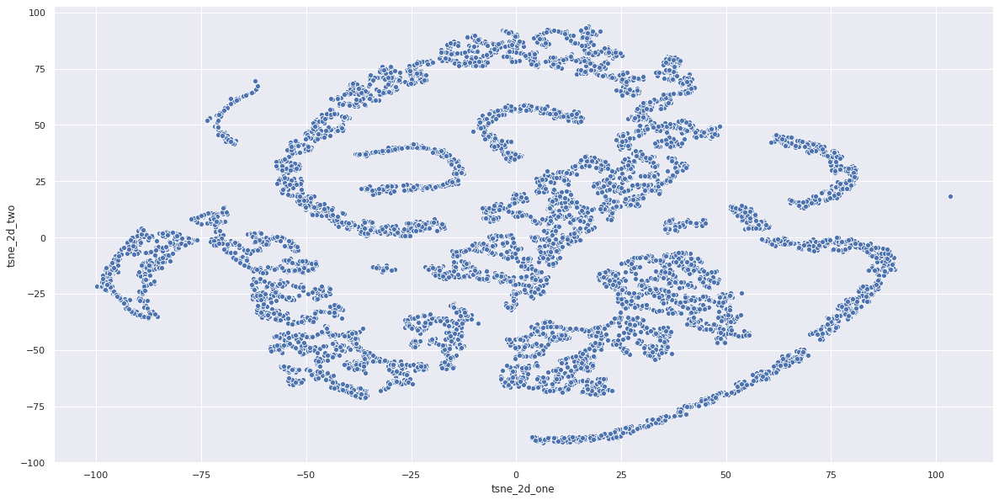

In [68]:
tsne_2d_one = X_embedded[:,0]
tsne_2d_two = X_embedded[:,1]

sns.set(rc={'figure.figsize':(20,10)})
sns.scatterplot(x=tsne_2d_one, y=tsne_2d_two);
plt.xlabel('tsne_2d_one');
plt.ylabel('tsne_2d_two');

In [0]:
X_embedded = TSNE(n_components=1).fit_transform(nyc_taxi_df[features])

In [70]:
X_embedded.shape

(10266, 1)

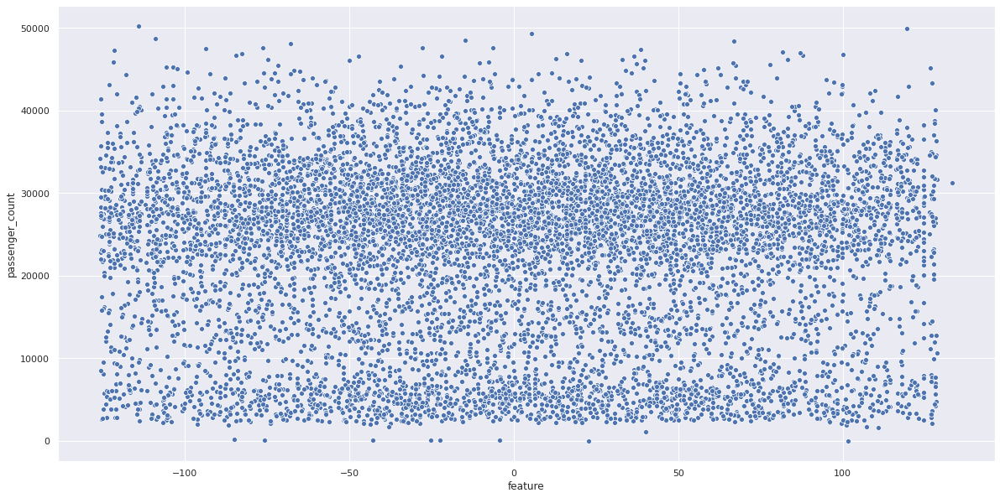

In [71]:
tsne_df = pd.DataFrame()
tsne_df['feature'] = X_embedded.ravel()
tsne_df['passenger_count'] = nyc_taxi_df['passenger_count']

sns.set(rc={'figure.figsize':(20,10)})
sns.scatterplot(x=tsne_df['feature'], y=tsne_df['passenger_count']);
plt.xlabel('feature');
plt.ylabel('passenger_count');

Nope not so lucky. Anyways let's continue.

# Regression

Okay now this is important. We are dealing with time series data. Hence we just cannot randomly split the dataset as we usually do. To prevent data leakage we will sort our dataset by timestamp and then slice it vertically so that all the timestamps in our test data are periodically later in time than in the train set.

In [0]:
nyc_taxi_df = nyc_taxi_df.sort_values(by='timestamp', ascending=True)

In [0]:
nyc_taxi_df.reset_index(drop=True,inplace=True)

In [0]:
div_index = np.abs(nyc_taxi_df.shape[0] * 0.8)

train = nyc_taxi_df.loc[0:div_index]
test = nyc_taxi_df.loc[div_index:]
test.reset_index(drop=True,inplace=True)

In [75]:
print('Train %:', train.shape[0] / nyc_taxi_df.shape[0] * 100, ', Test %:', test.shape[0] / nyc_taxi_df.shape[0] * 100)

Train %: 80.00194817845315 , Test %: 19.998051821546852


In [0]:
X_train = train[features]
y_train = train[target]

X_test = test[features]
y_test = test[target]

With that taken care of we will start with the most basic linear regression model and see how it performs.

In [0]:
reg = LinearRegression().fit(X_train, y_train)

We will use "Coefficient of Determination" as our evaluation metric. A higher coefficient is an indicator of a better goodness of fit for the observations. The best possible score is 1.0

In [78]:
reg.score(X_test, y_test)

0.9506432013700636

Hmm definitely not bad. Just for comparison let us also implement an XGBoost regressor. Note that XGBRegressor offers a wide range of hyper-parameters but I'm using all of them to be their default values as I believe the purpose of this notebook isn't to demonstrate my tuning skills.

Frankly, here we can implement any fancy or non-fancy model we like.

In [0]:
reg = xgb.XGBRegressor()

In [80]:
X_train['weather_description'] = X_train['weather_description'].astype(int)
X_test['weather_description'] = X_test['weather_description'].astype(int)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Because XGBRegressor does not allow non numeric values

In [81]:
reg.fit(X_train,y_train)

/usr/local/lib/python3.6/dist-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/usr/local/lib/python3.6/dist-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[07:56:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [82]:
reg.score(X_test, y_test)

0.9668682598255208

Yep XGBoost regressor performs better than simple linear regression.

# Anomaly Detection

Alright let's have a go at anomaly detection.

First let's visualize the time series data as a line graph with timestamp on the x-axis and passenger count on y.

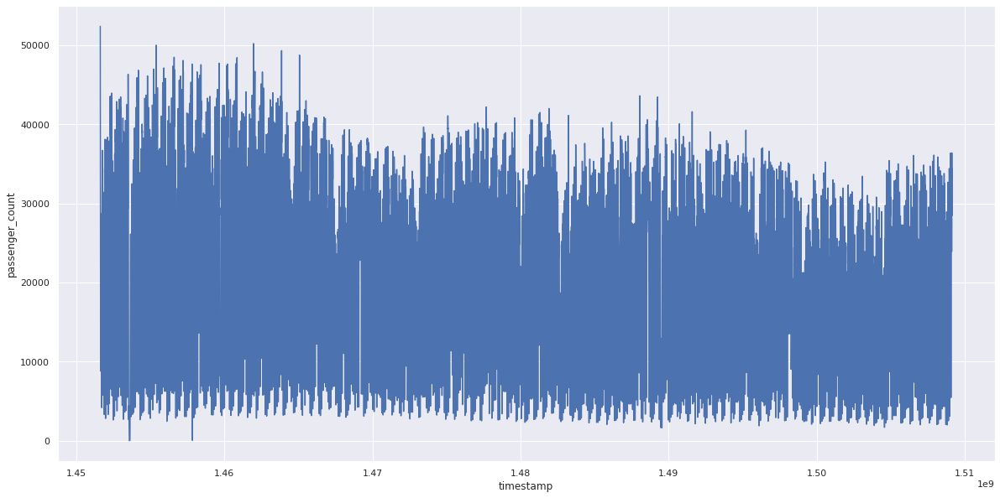

In [83]:
sns.set(rc={'figure.figsize':(20,10)})
sns.lineplot(x="timestamp", y="passenger_count", data=nyc_taxi_df);
plt.xlabel('timestamp');
plt.ylabel('passenger_count');

No clear visible anomalies. Let us zoom in and see.

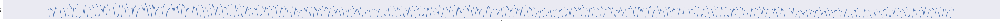

In [84]:
sns.set(rc={'figure.figsize':(500,10)})
sns.lineplot(x="timestamp", y="passenger_count", data=nyc_taxi_df);
plt.xlabel('timestamp');
plt.ylabel('passenger_count');

Well it seems to be following a very redundant pattern without any obvious anomalies.

Anyways we will implement a number of anomaly detection algorithms. Again We will fit the model on train data and find anomalies on test data. 

In [0]:
df_for_anamoly_detection = train[['passenger_count']]
df_for_anamoly_detection_test = test[['passenger_count']]

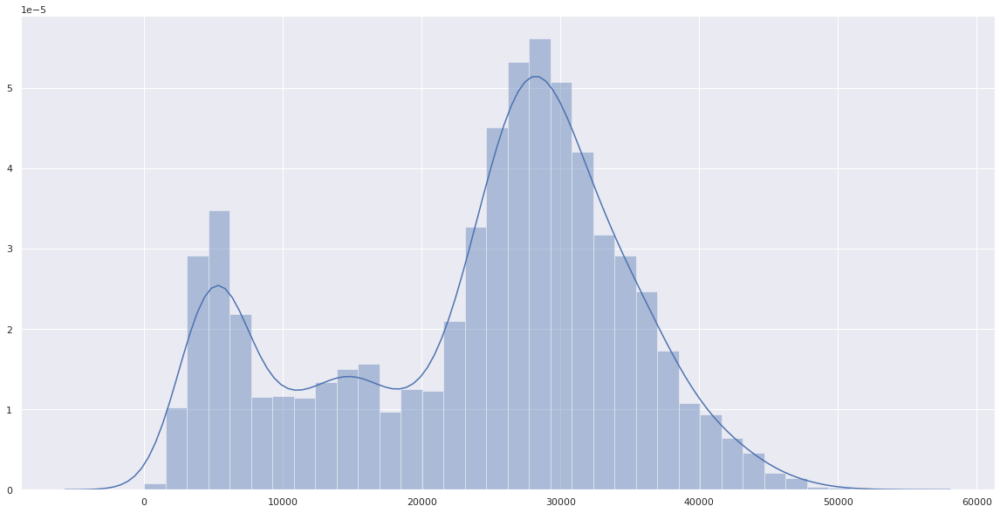

In [86]:
fig, ax = plt.subplots(figsize=(20,10))
sns.distplot(df_for_anamoly_detection);

As we can see, the distribution of our target feature resembles quite a lot the  gaussian distribution, and thus the EllipticEnvelope technique for anomaly detection has comparatively the best results. Thst's why I have only kept it as the main section. The other anomaly detection techniques are in the last section with their terrible results. 

## Detecting outliers in a Gaussian distributed dataset

In [0]:
cov = EllipticEnvelope(random_state=0).fit(df_for_anamoly_detection)

In [88]:
test['anomaly'] = pd.Series(cov.predict(df_for_anamoly_detection_test))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


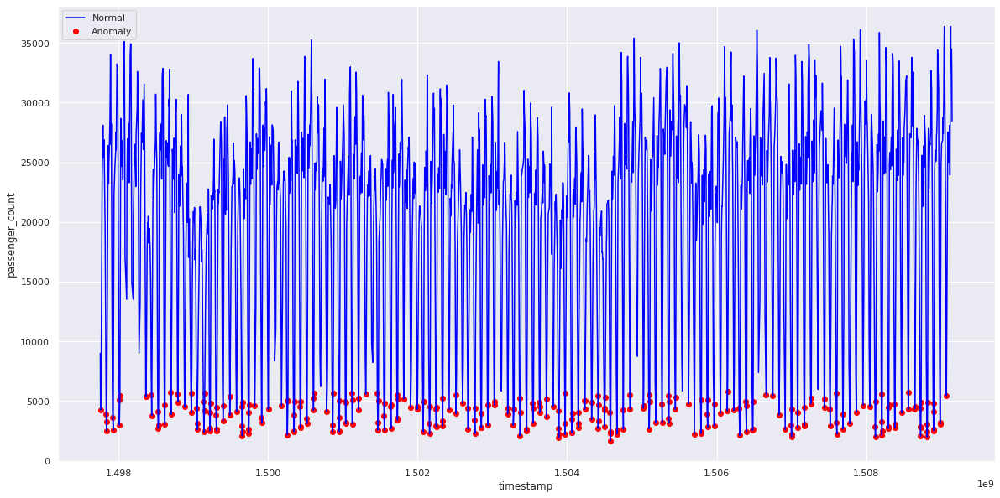

In [89]:
fig, ax = plt.subplots(figsize=(20,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

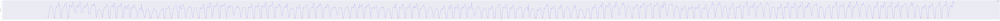

In [90]:
fig, ax = plt.subplots(figsize=(500,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

As you can see these are not actually anomalies but the result is comparatively much better than the ones in the next section.

# Other Anomaly detection techniques

The results are definitely erroneous.

## Isolation Forest Algorithm

In [0]:
clf = IsolationForest(random_state=0).fit(df_for_anamoly_detection)

In [92]:
test['anomaly'] = pd.Series(clf.predict(df_for_anamoly_detection_test))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


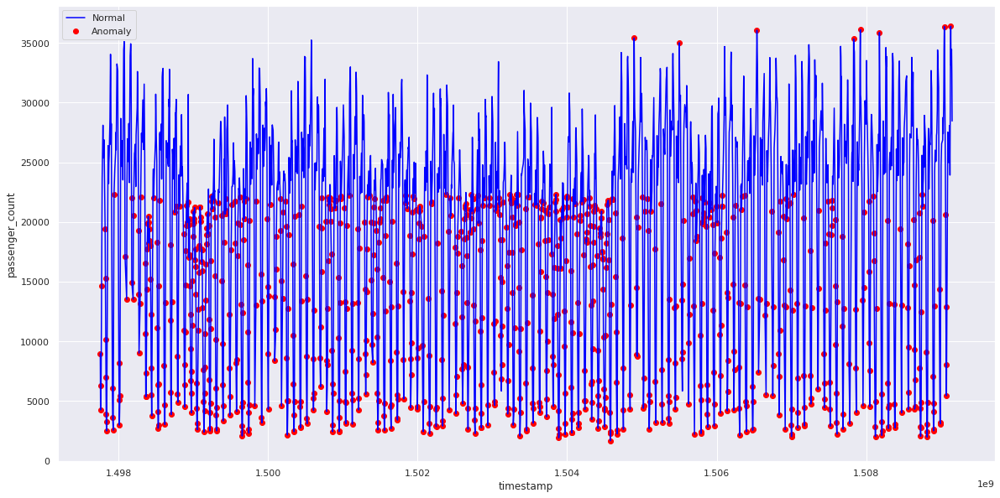

In [93]:
fig, ax = plt.subplots(figsize=(20,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

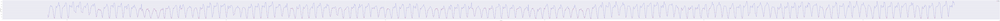

In [94]:
fig, ax = plt.subplots(figsize=(500,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

## One Class SVM

In [0]:
clf = OneClassSVM(gamma='auto').fit(df_for_anamoly_detection)

In [96]:
test['anomaly'] = pd.Series(clf.predict(df_for_anamoly_detection_test))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


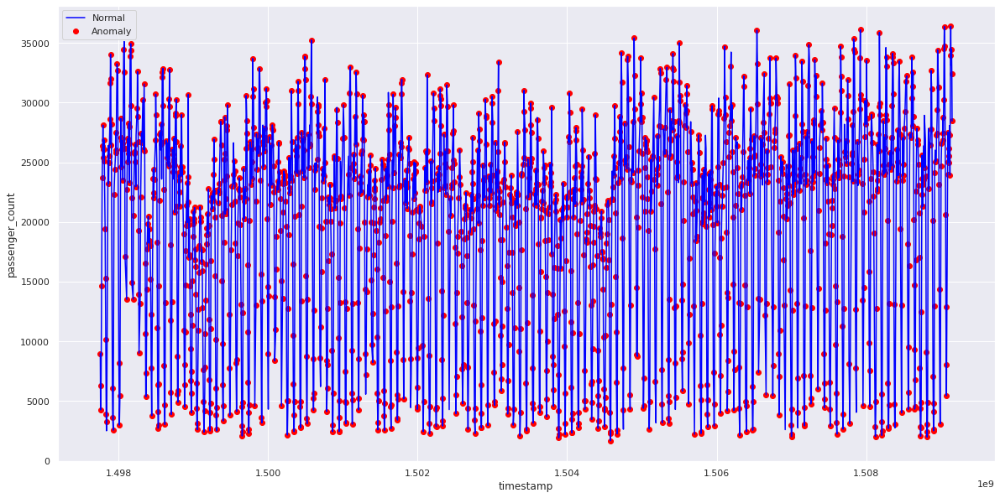

In [97]:
fig, ax = plt.subplots(figsize=(20,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

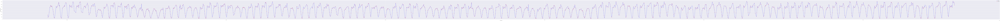

In [98]:
fig, ax = plt.subplots(figsize=(500,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

## Unsupervised Outlier Detection using Local Outlier Factor (LOF)

In [0]:
neigh = clf = LocalOutlierFactor(n_neighbors=2).fit(df_for_anamoly_detection)

In [100]:
test['anomaly'] = pd.Series(clf.fit_predict(df_for_anamoly_detection_test))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


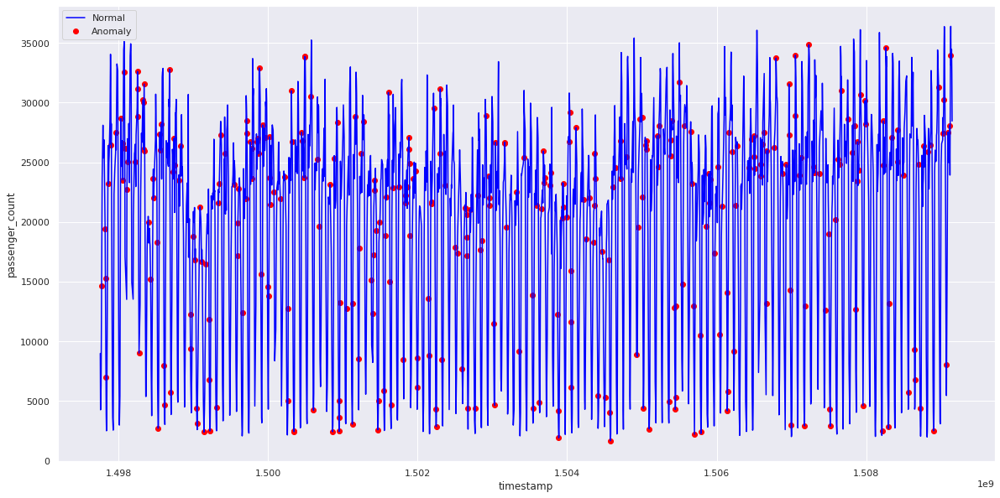

In [101]:
fig, ax = plt.subplots(figsize=(20,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();

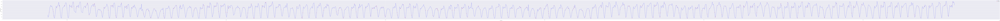

In [102]:
fig, ax = plt.subplots(figsize=(500,10))

a = test.loc[test['anomaly'] == -1, ['timestamp', 'passenger_count']]

ax.plot(test['timestamp'], test['passenger_count'], color='blue', label = 'Normal')
ax.scatter(a['timestamp'],a['passenger_count'], color='red', label = 'Anomaly')
plt.legend();
plt.xlabel('timestamp');
plt.ylabel('passenger_count');
plt.show();